# Importing packages

In [1]:
# The basics
import numpy as np
import pandas as pd

# Cross validation and model selection
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV

# Models
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.multioutput import RegressorChain

# Plotting
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms
import matplotlib.ticker as ticker
import matplotlib.pylab as pl

# Looping
import itertools

# Helper functions

### Actual vs. Predicted plotter function

In [2]:
def plot_actual_vs_pred(actual, pred, title, info):
    
    # Gasses
    gasses = ['NO', 'NO_2', 'NH_3']
    
    # Getting axis limits to have uniform plots for all gasses
    axis_min = pred.min()
    axis_max = pred.max()
    
    print(axis_min)
    print(axis_max)
    
    # Dividing into 3 subplots
    fig, axs = plt.subplots(1,3, figsize=(30,10), dpi = 300)
    
    # Main title
    fig.suptitle(title, fontsize=35)
    
     # Axis params
    plt.xticks(rotation=45)
    
    
    for i, ax in enumerate(axs.flat):
        
        # Data
        ax.scatter(actual[:,i], pred[:,i], c='black', alpha = 0.4)
        
        # Identity line y=x
        line = mlines.Line2D([0, 1], [0, 1], color='red')
        transform = ax.transAxes
        line.set_transform(transform)
        ax.add_line(line)
        
        # Text box with information of the fit
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.6)
        textstr = info
        ax.text(0.05, 0.95,
                textstr,
                transform = ax.transAxes,
                fontsize = 20,
                verticalalignment = 'top',
                bbox = props,
                fontname = 'Helvetica'
               )
        
        # Plot title and axis names
        ax.set_title(f'${gasses[i]}$', fontname = 'Helvetica', fontsize = 30)
        ax.set_ylabel('Predicted (ppm)', fontname = 'Helvetica', fontsize = 25)
        ax.set_xlabel('Actual (ppm)', fontname = 'Helvetica', fontsize = 25)
        
        # Setting axis limits (defined above)
        if axis_min >0 or axis_max < 80:
            ax.set_xlim(-5, 85)
            ax.set_ylim(-5, 85)
        else:
            ax.set_xlim(axis_min + 5, axis_max + 5)
            ax.set_ylim(axis_min + 5, axis_max + 5)
        
        # Setting minor ticks in fixed levels (5, 10, 20, 40, 80)
        ax.xaxis.set_minor_locator(ticker.FixedLocator([5,10,20,40,80]))
        ax.yaxis.set_minor_locator(ticker.FixedLocator([5,10,20,40,80]))
        
        # Major tick style
        ax.grid(linestyle='-', linewidth=0.5)
        ax.tick_params(axis='x', which='major', labelsize=20, rotation = 45)
        # Font size of tick labels (numbers)
        ax.tick_params(axis='both', which='major', labelsize=20)
        
        # Minor tick style
        ax.grid(axis = 'x', which = 'minor',linestyle=':', linewidth=0.5,color = "fuchsia")
        ax.tick_params(which = 'minor', axis="x", direction="in",
                       length=10, width=3, color="fuchsia", rotation = 45, labelsize = 12)
        ax.xaxis.set_minor_formatter('{x:.0f}')
        
        
    
    plt.show()

### Plot features through time

In [3]:
def plot_features(data):
    #ax = ax
    mixes = list(itertools.product([5,10,20,40,80],repeat = 3)) # 125
    n_mix = len(mixes) # 125 unique gas mixtures
    n_features = 240 # 240 slopes and 240 avgs

    # Plotting colormap
    colors = pl.cm.jet(np.linspace(0,1,n_mix))
    normalized = True

    for mix, i  in zip(mixes, range(n_mix)):
        maskNO = data['NO'] == mix[0]
        maskNO2 = data['NO2'] == mix[1]
        maskNH3 = data['NH3'] == mix[2]
        masked = data[(maskNO) & (maskNO2) & (maskNH3)]

        avg_feature = masked.mean(axis = 0)[3:]
        plt.plot(range(n_features), avg_feature, color = colors[i])
        
def plot_features_subplot(data, scaled_data, title, yaxis):

    # Dividing into 2 subplots
    fig = plt.figure(figsize = (30,15), dpi = 300)
    ax1 = fig.add_subplot(211)
    ax2 = fig.add_subplot(212) 

    # Main title
    fig.suptitle(title, fontsize=35, fontname = 'Helvetica')

    # Un-normalized
    ax1.set_title('Un-normalized', fontsize = 30, fontname = 'Helvetica')
    ax1.set_xlabel('Index', fontsize = 25, fontname = 'Helvetica')
    ax1.set_ylabel(yaxis, fontsize = 25, fontname = 'Helvetica')

    # Un-normalized
    ax2.set_title('Normalized', fontsize = 30, fontname = 'Helvetica')
    ax2.set_xlabel('Index', fontsize = 25, fontname = 'Helvetica')
    ax2.set_ylabel(yaxis, fontsize = 25, fontname = 'Helvetica')

    # Major tick style
    ax1.grid(linestyle='-', linewidth=1)
    ax1.tick_params(axis='x', which='major', labelsize=20)
    # Font size of tick labels (numbers)
    ax1.tick_params(axis='both', which='major', labelsize=20)

    # Major tick style
    ax2.grid(linestyle='-', linewidth=1)
    ax2.tick_params(axis='x', which='major', labelsize=20)
    # Font size of tick labels (numbers)
    ax2.tick_params(axis='both', which='major', labelsize=20)


    plt.subplot(2, 1, 1)
    plot_features(data)

    plt.subplot(2, 1, 2)
    plot_features(scaled_data)
    plt.show()
    

# Reading data

**Note**: Refer to `real_data.ipynb` to check preprocessing steps.

In [4]:
sensor = pd.read_csv('../data/sensor2.csv')

In [5]:
sensor.head(10)

,exposure,NO,NO2,NH3,0.05-1-slope-0,0.05-1-slope-1,0.05-1-slope-2,0.05-1-slope-3,0.05-1-slope-4,0.05-1-slope-5,...,2500.0-1-avg-230,2500.0-1-avg-231,5000.0-1-avg-232,5000.0-1-avg-233,5000.0-1-avg-234,5000.0-1-avg-235,5000.0-1-avg-236,5000.0-1-avg-237,5000.0-1-avg-238,5000.0-1-avg-239
0,1.0,10.0,5.0,20.0,-22.588416,-28.185027,-0.482129,-0.156366,-0.247580,-0.039092,...,33.580968,33.587483,33.815517,33.877412,33.861124,33.861124,33.838321,33.854609,33.844836,33.867639
1,1.0,10.0,5.0,20.0,-39.019909,-9.961837,-0.495160,-0.130305,-0.114017,-0.094471,...,33.815517,33.835063,34.020748,34.059839,34.105446,34.072870,34.059839,34.066355,34.072870,34.048438
2,1.0,10.0,5.0,20.0,-33.573149,-15.193593,-0.273641,-0.234549,-0.078183,-0.117275,...,33.904559,33.929534,34.131507,34.199918,34.206433,34.193402,34.180372,34.193402,34.180372,34.209691
3,1.0,10.0,5.0,20.0,-40.199171,-8.691361,-0.325763,-0.039092,-0.299702,-0.091214,...,33.981656,34.024006,34.199918,34.268328,34.235752,34.245524,34.252040,34.252040,34.258555,34.287874
4,2.0,20.0,40.0,40.0,-23.546159,-26.825509,-0.447381,-0.247580,-0.377885,-0.034748,...,33.538619,33.554907,33.711273,33.802487,33.799229,33.763395,33.763395,33.760137,33.786198,33.756880
5,2.0,20.0,40.0,40.0,-33.775122,-15.284807,-0.169397,-0.286672,-0.065153,-0.026061,...,33.460435,33.467494,33.690098,33.756880,33.747107,33.734076,33.701500,33.727561,33.708015,33.730819
6,2.0,20.0,40.0,40.0,-36.952398,-12.140107,-0.371370,-0.234549,-0.091214,-0.078183,...,33.473466,33.460435,33.665666,33.711273,33.738963,33.714531,33.701500,33.704758,33.714531,33.685212
7,2.0,20.0,40.0,40.0,-36.980632,-12.105358,-0.351824,-0.169397,-0.104244,-0.104244,...,33.466951,33.450662,33.636347,33.724303,33.730819,33.704758,33.708015,33.730819,33.711273,33.711273
8,3.0,40.0,40.0,80.0,-24.041319,-26.556211,-0.351824,-0.312733,-0.156366,-0.117275,...,33.444147,33.431117,33.620059,33.668924,33.698242,33.708015,33.681954,33.688470,33.691727,33.685212
9,3.0,40.0,40.0,80.0,-39.287035,-9.877138,-0.534251,0.078183,-0.143336,-0.130305,...,33.466951,33.445776,33.587483,33.701500,33.694985,33.704758,33.701500,33.678697,33.653450,33.708015


In [6]:
# Dependent Variables - gas concentrations
y = np.asarray(sensor.iloc[:, :4])

# Independent variables - shape features
X = np.asarray(sensor.iloc[:, 4:])

In [7]:
# Scaling data
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)
scaled_X = pd.DataFrame(scaled_X)
y = pd.DataFrame(y)
scaled = pd.concat((y, scaled_X), axis = 1)
colnames = sensor.columns
scaled.columns = colnames

In [8]:
scaled.head(10)

,exposure,NO,NO2,NH3,0.05-1-slope-0,0.05-1-slope-1,0.05-1-slope-2,0.05-1-slope-3,0.05-1-slope-4,0.05-1-slope-5,...,2500.0-1-avg-230,2500.0-1-avg-231,5000.0-1-avg-232,5000.0-1-avg-233,5000.0-1-avg-234,5000.0-1-avg-235,5000.0-1-avg-236,5000.0-1-avg-237,5000.0-1-avg-238,5000.0-1-avg-239
0,1.0,10.0,5.0,20.0,2.033884,-2.024181,-1.491787,0.008906,-1.663958,0.523062,...,2.237116,2.250681,2.286884,2.286337,2.272227,2.278346,2.260119,2.282564,2.276652,2.301890
1,1.0,10.0,5.0,20.0,-0.661288,0.869532,-1.613034,0.294908,-0.053896,-0.157638,...,2.491954,2.519748,2.509506,2.483717,2.536242,2.506909,2.499037,2.510810,2.522155,2.496103
2,1.0,10.0,5.0,20.0,0.232116,0.038766,0.448171,-0.849101,0.378072,-0.437926,...,2.588698,2.622419,2.629652,2.635277,2.645369,2.637014,2.629036,2.647757,2.637892,2.669321
3,1.0,10.0,5.0,20.0,-0.854716,1.071274,-0.036819,1.295916,-2.292275,-0.117596,...,2.672464,2.725089,2.703859,2.709294,2.677050,2.693276,2.706333,2.710963,2.722064,2.753305
4,2.0,20.0,40.0,40.0,1.876790,-1.808299,-1.168460,-0.992102,-3.234751,0.576450,...,2.191104,2.215277,2.173806,2.205270,2.205343,2.172855,2.179309,2.180732,2.213523,2.182912
5,2.0,20.0,40.0,40.0,0.198987,0.024282,1.418149,-1.421105,0.535152,0.683227,...,2.106158,2.120278,2.150837,2.155925,2.149020,2.141208,2.112553,2.145617,2.129351,2.154917
6,2.0,20.0,40.0,40.0,-0.322165,0.523638,-0.461184,-0.849101,0.220993,0.042568,...,2.120315,2.112607,2.124334,2.106580,2.140220,2.120110,2.112553,2.121037,2.136365,2.105926
7,2.0,20.0,40.0,40.0,-0.326796,0.529156,-0.279313,-0.134095,0.063914,-0.277761,...,2.113237,2.101986,2.092531,2.120679,2.131419,2.109561,2.119580,2.149129,2.132858,2.133921
8,3.0,40.0,40.0,80.0,1.795572,-1.765537,-0.279313,-1.707107,-0.564403,-0.437926,...,2.088461,2.080744,2.074862,2.060760,2.096217,2.113077,2.091472,2.103480,2.111815,2.105926
9,3.0,40.0,40.0,80.0,-0.705103,0.882981,-1.976776,2.582925,-0.407324,-0.598090,...,2.113237,2.096675,2.039525,2.096006,2.092697,2.109561,2.112553,2.092945,2.070606,2.130422


/Users/cosmo/opt/anaconda3/envs/thesis/lib/python3.7/site-packages/ipykernel_launcher.py:53: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Users/cosmo/opt/anaconda3/envs/thesis/lib/python3.7/site-packages/ipykernel_launcher.py:56: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


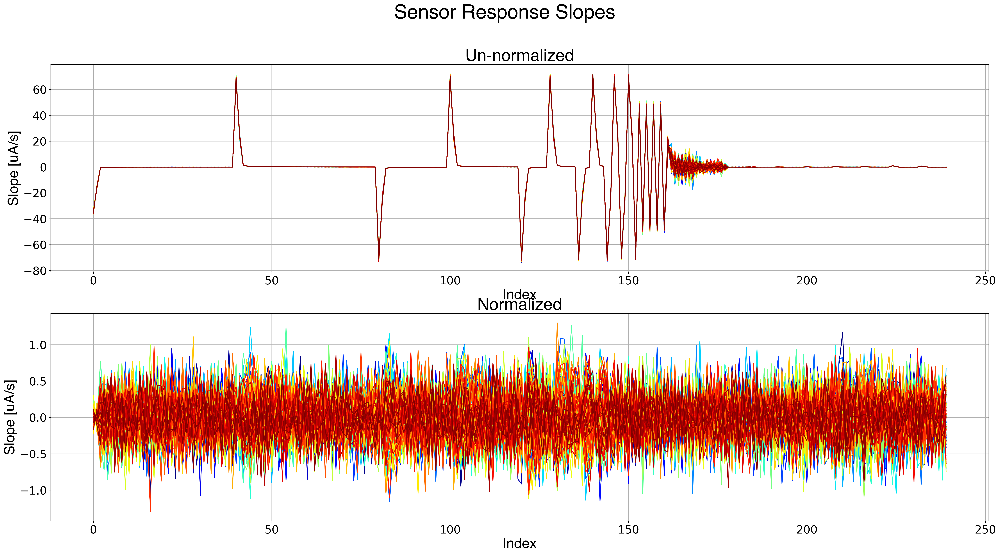

/Users/cosmo/opt/anaconda3/envs/thesis/lib/python3.7/site-packages/ipykernel_launcher.py:53: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/Users/cosmo/opt/anaconda3/envs/thesis/lib/python3.7/site-packages/ipykernel_launcher.py:56: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


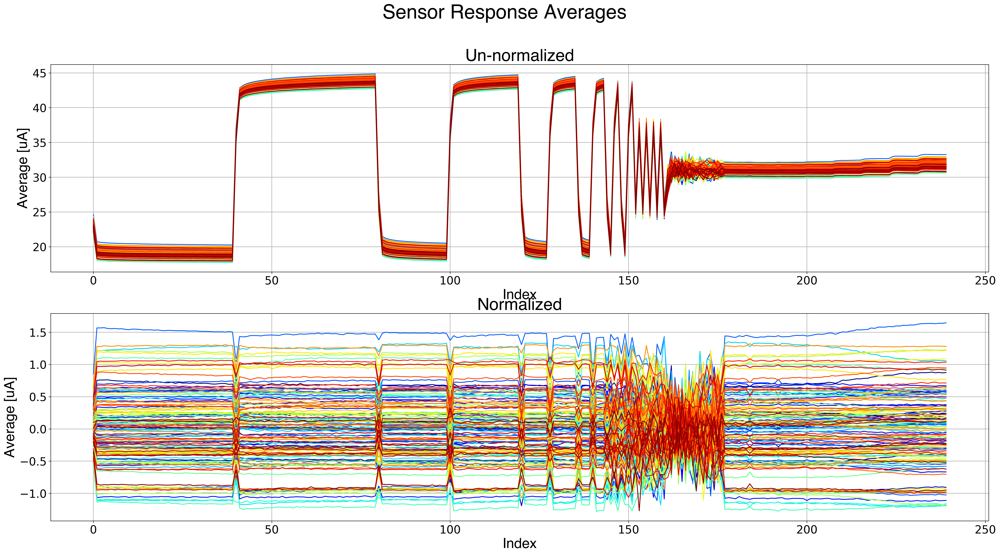

In [9]:
slopes = sensor.iloc[:,1:244]
slopes_scaled = scaled.iloc[:,1:244]

avgs = pd.concat([sensor.iloc[:, 1:4], sensor.iloc[:, 244:]], axis = 1)
avgs_scaled = pd.concat([scaled.iloc[:, 1:4], scaled.iloc[:, 244:]], axis = 1)

plot_features_subplot(slopes, slopes_scaled, 'Sensor Response Slopes', 'Slope [uA/s]')
plot_features_subplot(avgs, avgs_scaled, 'Sensor Response Averages', 'Average [uA]')

### Train/test/val split

In [10]:
# Dependent Variables - gas concentrations
y = np.asarray(scaled.iloc[:, 1:4])

# Independent variables - shape features
X = np.asarray(scaled.iloc[:, 4:])

# Train test split
X, X_val, y, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# OLS

### Fitting pipeline to training data

In [11]:
steps = [('poly', PolynomialFeatures()),
         ('linreg', LinearRegression())]

params = [{'poly__degree':list(range(1,3))}]

pipe = Pipeline(steps)

grid_search = GridSearchCV(pipe,
                           params,
                           scoring = 'neg_root_mean_squared_error',
                           return_train_score=True
                          )

# Fitting to training data (test data is implicitly inside CV search.)
grid_search.fit(X, y)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

### Cross validation results 

TODO: beautify

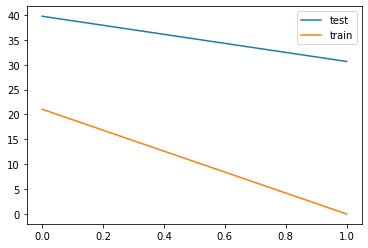

In [12]:
test_scores = grid_search.cv_results_['mean_test_score'] * - 1
train_scores = grid_search.cv_results_['mean_train_score'] * -1 

plt.plot(test_scores, label='test')
plt.plot(train_scores, label='train')
plt.legend(loc='best')
plt.show()

### Predictions

-33.1462500245588
117.67691087046038


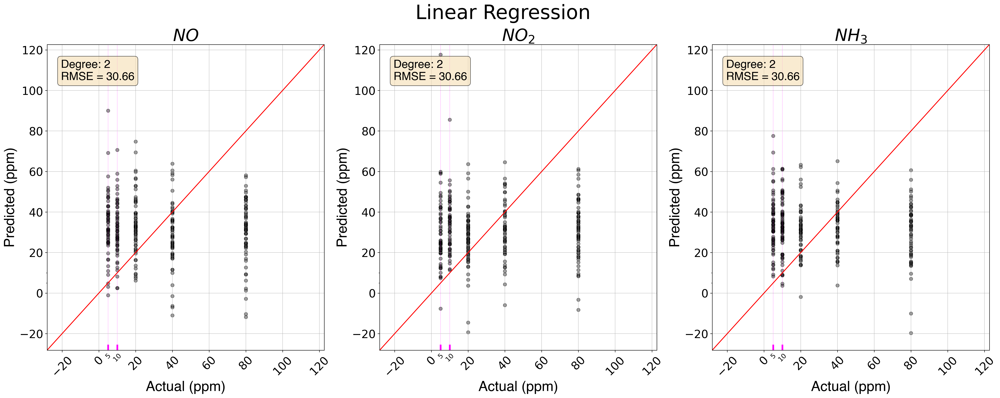

In [13]:
# Predicting on unseen validation data
y_pred = grid_search.best_estimator_.predict(X_val)

# Plotting actual vs. predicted
# Information to display
info = f"Degree: {best_params['poly__degree']}\nRMSE = {round((best_score * -1), 2)}"
plot_actual_vs_pred(y_val, y_pred, 'Linear Regression', info)    

# PCR

### Fitting pipeline to training data

In [14]:
steps = [('scaler', StandardScaler()),
         ('PCA', PCA()),
         ('linreg', LinearRegression())]

n_PC = list(range(1,200))

params = [{'PCA__n_components':n_PC}]

pipe = Pipeline(steps)

grid_search = GridSearchCV(pipe,
                           params,
                           scoring = 'neg_root_mean_squared_error',
                           return_train_score=True)

grid_search.fit(X, y)
#pipe.fit(X, y)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

### CV results

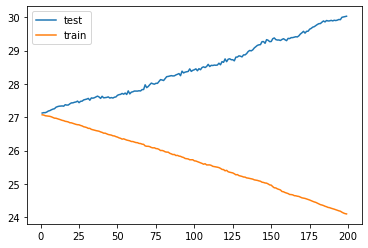

In [15]:
test_scores = -grid_search.cv_results_['mean_test_score']
train_scores = -grid_search.cv_results_['mean_train_score']

plt.plot(n_PC,test_scores, label='test')
plt.plot(n_PC,train_scores, label='train')
plt.legend(loc='best')
plt.show()

### Predictions

23.57783133852049
34.56105327406588


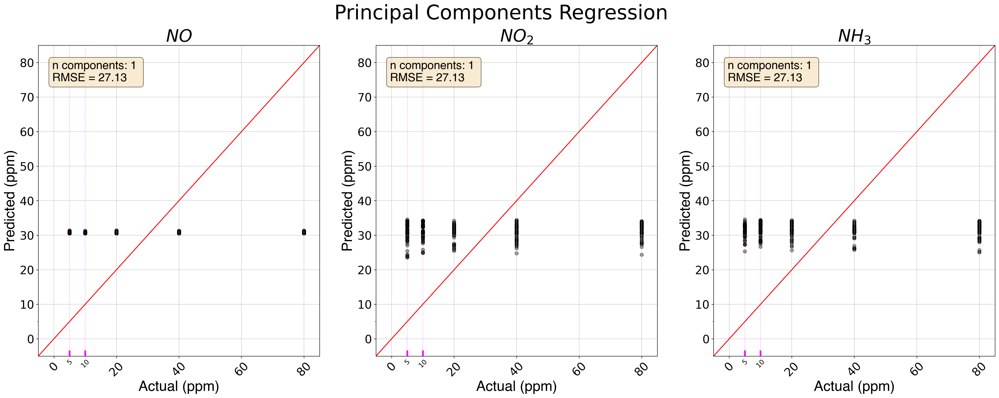

In [16]:
# Predicting on unseen validation data
y_pred = grid_search.best_estimator_.predict(X_val)

#y_pred = pipe.predict(X_val)

# Plotting actual vs. predicted
#Information to display
info = f"n components: {best_params['PCA__n_components']} \nRMSE = {round((best_score * -1), 2)}"
plot_actual_vs_pred(y_val, y_pred, 'Principal Components Regression', info)    

# PLSR

In [17]:
steps = [('PLSR', PLSRegression())]

n_comps = list(range(1,200))

params = [{'PLSR__n_components':n_comps}]

pipe = Pipeline(steps)

grid_search = GridSearchCV(pipe,
                           params,
                           scoring = 'neg_root_mean_squared_error',
                           return_train_score=True
                          )

grid_search.fit(X, y)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

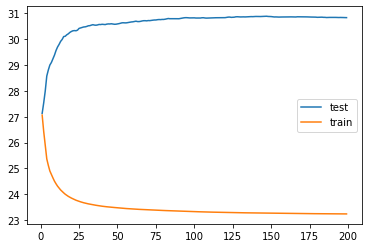

In [18]:
test_scores = -grid_search.cv_results_['mean_test_score']
train_scores = -grid_search.cv_results_['mean_train_score']

plt.plot(n_comps,test_scores, label='test')
plt.plot(n_comps,train_scores, label='train')
plt.legend(loc='best')
plt.show()

23.07521905011486
34.88340303753843


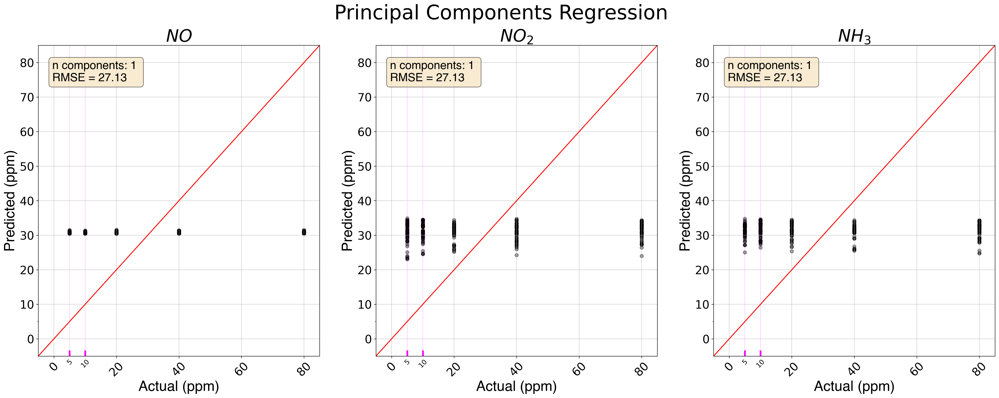

In [19]:
# Predicting on unseen validation data
y_pred = grid_search.best_estimator_.predict(X_val)


# Plotting actual vs. predicted
#Information to display
info = f"n components: {best_params['PLSR__n_components']} \nRMSE = {round((best_score * -1), 2)}"
plot_actual_vs_pred(y_val, y_pred, 'Principal Components Regression', info)    

# Ridge